# Anastomotic Leakage Prediction
### Phase 1 - Statistical Analysis

In [1]:
import pandas as pd
import numpy as np
import re
import math
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline  
from datetime import datetime
from datetime import date 
from scipy import stats
import statsmodels.stats as ss 

import warnings
warnings.filterwarnings("ignore")


In [2]:
COMBINED_DATA_FILE = '../data_files/matrix0_missing_values.xlsx'
# EVENTS = '../data_files/data1.csv'
PATIENTS = '../data_files/anonymous_080620_DA_eg.xlsx' # Patient surgery data

full_df = pd.read_excel(COMBINED_DATA_FILE, header=[0,1,2,3])[1:]
# events_df = pd.read_csv(EVENTS)
patients_df = pd.read_excel(PATIENTS)

In [3]:
full_df

type metadata                                       \
           time  general                                        
        feature      Sex      Age   Urgency Surgical approach   
      statistic constant constant  constant          constant   
1       1123813     male     59.0  elective              Open   
2       1135541   female     43.0  elective              Open   
3       3918745   female     57.0  elective      Laparoscopic   
4       4894647      NaN      NaN  elective              Open   
5       6541482   female     65.0    urgent              Open   
..          ...      ...      ...       ...               ...   
521  1031926105   female     63.0  elective              Open   
522  1032366104   female     63.0  elective              Open   
523  1033842103     male     61.0  elective              Open   
524  1034462102     male     76.0  elective              Open   
525  1035830101   female     65.0  elective              Open   

                     numeric_events                        ...                \
                     before_surgery                        ... after_surgery   
    Anastomotic Leak        Albumin                        ...       weight    
            constant            max      mean median  min  ...          mean   
1                1.0            4.2  4.200000   4.20  4.2  ...     96.966667   
2                0.0            NaN       NaN    NaN  NaN  ...     68.000000   
3                0.0            3.9  3.900000   3.90  3.9  ...           NaN   
4                0.0            4.3  4.300000   4.30  4.3  ...     71.125000   
5                0.0            3.1  1.942857   1.95  1.4  ...     54.666667   
..               ...            ...       ...    ...  ...  ...           ...   
521              0.0            NaN       NaN    NaN  NaN  ...           NaN   
522              0.0            4.1  4.100000   4.10  4.1  ...     50.500000   
523              1.0            4.8  4.800000   4.80  4.8  ...           NaN   
524              0.0            4.3  4.300000   4.30  4.3  ...           NaN   
525              0.0            3.7  3.700000   3.70  3.7  ...           NaN   

                     drugs                                     \
                  all_days                                      
                 Cefazolin Ceftriaxone Fleet enema Furosemide   
    median   min     count       count       count      count   
1    105.0  85.3       6.0        13.0         1.0       16.0   
2     68.0  68.0       NaN        10.0         NaN        2.0   
3      NaN   NaN       NaN         NaN         NaN        NaN   
4     74.6   0.0       5.0        12.0         1.0       38.0   
5     53.0  53.0       4.0        15.0         NaN      151.0   
..     ...   ...       ...         ...         ...        ...   
521    NaN   NaN       2.0         NaN         1.0        NaN   
522   52.0  46.0       3.0         1.0         2.0        2.0   
523    NaN   NaN       4.0        27.0         1.0        8.0   
524    NaN   NaN       5.0         NaN         1.0        NaN   
525    NaN   NaN       1.0         NaN         1.0        NaN   

                                                 
                                                 
    Magnesium sulfate Meroken new Metronidazole  
                count       count         count  
1                 4.0         1.0          52.0  
2                 NaN         NaN          26.0  
3                 NaN         NaN           NaN  
4                 1.0         1.0          73.0  
5                 7.0         NaN          51.0  
..                ...         ...           ...  
521               NaN         1.0           2.0  
522              24.0         2.0           4.0  
523              13.0         1.0          62.0  
524               2.0         1.0           3.0  
525               1.0         1.0           1.0  

[525 rows x 481 columns]

### 1.1
#### Feature Statistical Significance
We will reconstruct the data to remove the large headers to it will be easier to manipulate and calculate the p_value of all features. 
We will maintain 3 dataframes:
1. patient_data
2. before_surgery_data
3. after_surgery_data

For dataframes with median, mean, max, min we will take the $mean$ value 


In [4]:
# Group One - Group of the patient and surgery attributes
group_one = full_df.iloc[:, 0:6]
group_one.columns = full_df.columns.get_level_values(2)[0:6]
# group_one

# Group Two - Group of the event attributes
group_two = full_df.iloc[:,6:-7]
group_two = group_two.iloc[:, 1::4]  # 4 = Taking the mean from each features
group_two.columns = group_two.columns.get_level_values(2)

In [5]:
# Concatenating the two lists (easier to do this because of hierarchical headers)
raw_data = pd.concat([group_one, group_two], axis=1, sort=False)

In [6]:
# This data set has all data with smaller header
raw_data.rename(columns={'feature': 'ID'}, inplace=True)
raw_data

,ID,Sex,Age,Urgency,Surgical approach,Anastomotic Leak,Albumin,Alkaline Phosphatase,Amylase,BASO (%),...,WBC_1,blood pressure,blood pressure diastolic,blood pressure systolic,body temperature,heart rate,height,"respiratory rate, CO2",saturation,weight
1,1123813,male,59.0,elective,Open,1.0,4.200000,97.0,63.000000,0.500000,...,7.262093,89.676093,64.431373,120.596026,36.609656,87.566667,174.000000,9.800000,97.169284,96.966667
2,1135541,female,43.0,elective,Open,0.0,NaN,NaN,NaN,NaN,...,11.480556,90.180000,51.000000,97.000000,36.745455,87.760000,170.000000,6.647059,97.927711,68.000000
3,3918745,female,57.0,elective,Laparoscopic,0.0,3.900000,90.0,53.000000,0.400000,...,11.616000,115.000000,75.357143,126.851852,35.727778,73.147059,NaN,4.684211,96.787879,NaN
4,4894647,NaN,NaN,elective,Open,0.0,4.300000,70.0,NaN,0.300000,...,5.549455,89.430524,63.564885,114.832000,36.658712,86.694690,168.583333,6.585366,96.739583,71.125000
5,6541482,female,65.0,urgent,Open,0.0,1.942857,94.0,32.692308,0.121429,...,13.174151,99.845560,76.267176,128.078740,36.910182,89.780980,150.000000,8.125000,97.231970,54.666667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
521,1031926105,female,63.0,elective,Open,0.0,NaN,NaN,NaN,NaN,...,5.947778,106.214286,67.270588,121.282353,36.652381,100.649254,NaN,9.593750,97.245455,NaN
522,1032366104,female,63.0,elective,Open,0.0,4.100000,133.0,78.000000,0.600000,...,4.561719,102.408163,64.205357,119.700000,36.592308,87.720548,151.285714,5.288136,97.741935,50.500000
523,1033842103,male,61.0,elective,Open,1.0,4.800000,89.0,19.000000,0.300000,...,9.365849,98.692230,71.186441,129.844828,37.121285,87.518519,NaN,11.107143,96.892694,NaN
524,1034462102,male,76.0,elective,Open,0.0,4.300000,92.0,95.000000,0.500000,...,5.274000,121.948276,58.076923,118.947368,36.175000,74.742424,NaN,11.916667,97.530303,NaN


In [7]:
patients_df = patients_df.drop_duplicates() # Removed ~150 duplicates

In [8]:
# Attempted to add surgery name/area but there is an issue with the dates of each surgery. 

# Taking only relevant columns
patient_extra_data = pd.concat([patients_df.iloc[:,0:1], patients_df.iloc[:,-10:-9], patients_df.iloc[:,-9:-7]], axis=1, sort=False)
# Taking only patients that have more than one surgery, 36 patients
duplicate_sugeries_patients = patient_extra_data['Code'].value_counts().to_frame().iloc[:36,:].reset_index()
# Look at the entire row for these patients with many surgeries
temp = patient_extra_data.merge(duplicate_sugeries_patients,right_on="index", left_on="Code", how='inner')
temp.iloc[:50,:-2]


,Code_x,Surgery Date,Patient Classification,Name Of Surgery
0,111570821,2018-06-07,Surgical Oncology,Hipec
1,111570821,2018-05-06,Surgical Oncology,CYTOREDUCTIVE SURGERY WITH HIPEC (HYPERTHERMIC...
2,110558531,2018-06-02,Surgical Oncology,"OPEN HEPATECTOMY, PARTIAL, NON-ANATOMIC 322"
3,110558531,2018-05-30,Surgical Oncology,CYTOREDUCTIVE SURGERY WITH HIPEC (HYPERTHERMIC...
4,110558531,2018-12-10,Colorectal,"CLOSURE OF ILEOSTOMY, WITH SMALL TO SMALL ANAS..."
5,109193045,2018-07-16,Surgical Oncology,DIAGNOSTIC/ STAGING LAPAROSCOPY 493200
6,109193045,2018-05-15,Appendectomy,LAPAROSCOPIC APPENDECTOMY 449700
7,10887548,2018-05-28,Surgical Oncology,DIAGNOSTIC LAPAROSCOPY 493200;LYMPH NODE BIOPS...
8,10887548,2018-11-14,Surgical Oncology,EXPLORATORY LAPAROTOMY 490000;OPEN LIVER BIOPS...
9,10887548,2018-12-10,Surgical Oncology,GASTROSTOMY


In [9]:
# Remove single instance with robotic surgery (AL = 0)
raw_data = raw_data[raw_data['Surgical approach'] != 'Robotic Surgery']

We will not fill p_value data for each attribute, for the first 4 categorical features we will aquire the p-value from Fisher's exact test (https://en.wikipedia.org/wiki/Fisher%27s_exact_test)  while for the remaining numerical features we will use WRS

## DATA ISSUES EXPLORATION

In [10]:
# This function replaces all outlier data with the mean of each class
def replace(df):
    # Handling class 0
    class1 = df[raw_data['Anastomotic Leak'] == 0.0]
    mean, std = class1.mean(), class1.std()
    outliers = (class1 - mean).abs() > 3*std
    class1[outliers] = mean  # get the mean without the outliars
    # Handling class 1
    class2 = df[raw_data['Anastomotic Leak'] == 1.0]
    mean, std = class2.mean(), class2.std()
    outliers = (class2 - mean).abs() > 3*std
    class2[outliers] = mean  # get the mean without the outliars
    return pd.concat([class1, class2], axis=0)

In [11]:
# Initializing Raw Data Dataframes

patient_data = pd.DataFrame(raw_data.iloc[:,1:6])
# Data with outliers
before_surgery_data_no_od = pd.DataFrame(raw_data.iloc[:,5:59])
after_surgery_data_no_od = pd.DataFrame(pd.concat([raw_data[['Anastomotic Leak']],raw_data.iloc[:,59:]],axis =1))

# Dataframes with adjusted outliers
before_surgery_data = before_surgery_data_no_od[before_surgery_data_no_od.columns].apply(replace)
after_surgery_data = after_surgery_data_no_od[after_surgery_data_no_od.columns].apply(replace)

# Dataframes 
stats_patient_data = pd.DataFrame(columns = patient_data.columns ,index=['p_val','cv'])
stats_before_surgery_data = pd.DataFrame(columns=before_surgery_data.columns, index = ['p_val','cv'])
stats_after_surgery_data = pd.DataFrame(columns=after_surgery_data.columns, index = ['p_val','cv'])

# Constructing delta between before and after surgery
common_columns = set(before_surgery_data.columns).intersection(after_surgery_data)
delta = pd.DataFrame(columns = common_columns)
delta.drop('Anastomotic Leak', inplace=True, axis=1)
stats_surgery_data_delta = pd.DataFrame(columns=delta.columns, index = ['p_val','cv'])

In [12]:
# Populating delta df
for i in delta.columns:
    # After Surgery - Before Surgery
    delta[i] = after_surgery_data[i] - before_surgery_data[i]

##### Investigating the Outlier Detection Replacement

In [13]:
def outlier_detection_viz(df,title,df_od,title_od):
    fig, ax = plt.subplots(1, 2, figsize=(15,5))
    ax[0].set_title(title + ' original data')
    sns.boxplot(x=df.columns[0], y=df.columns[1], data=df,ax=ax[0])
    sns.swarmplot(x=df.columns[0], y=df.columns[1], data=df, color=".15",ax=ax[0])

    ax[1].set_title(title_od+' after outlier detection')
    sns.boxplot(x=df_od.columns[0], y=df_od.columns[1], data=df_od,ax=ax[1])
    sns.swarmplot(x=df_od.columns[0], y=df_od.columns[1], data=df_od, color=".15",ax=ax[1])
    plt.show()
    return

Before Surgery


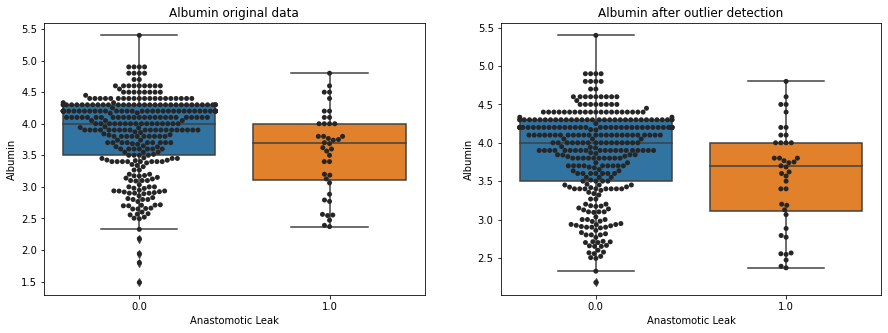

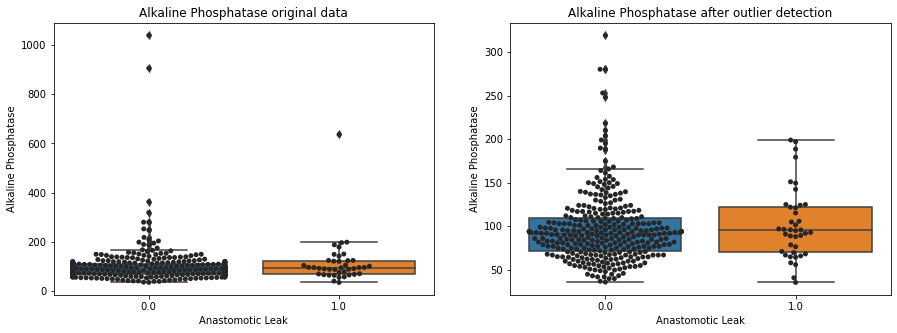

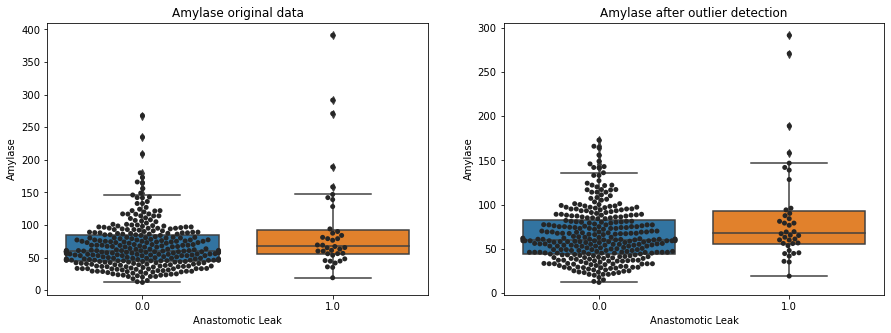

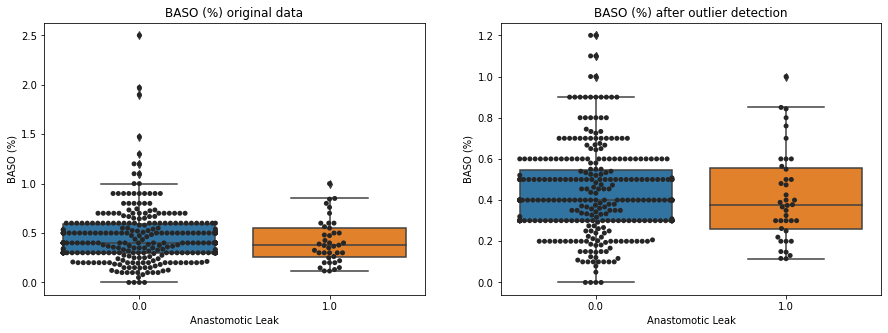

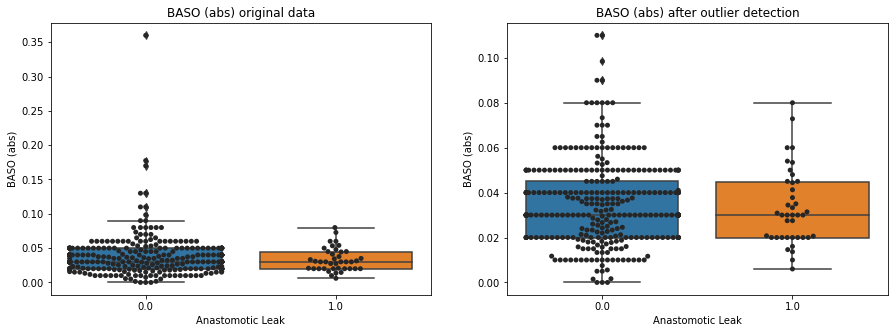

...

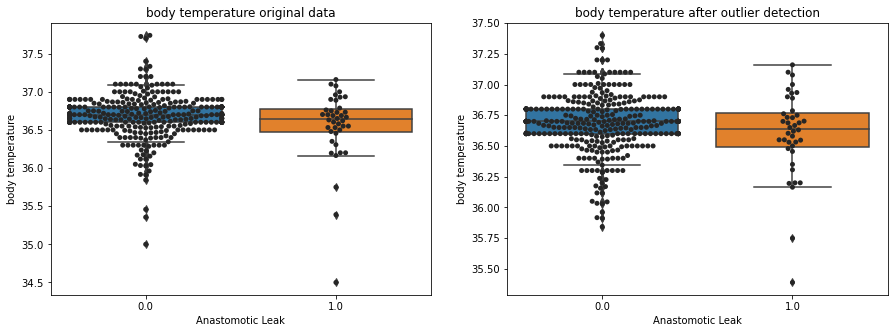

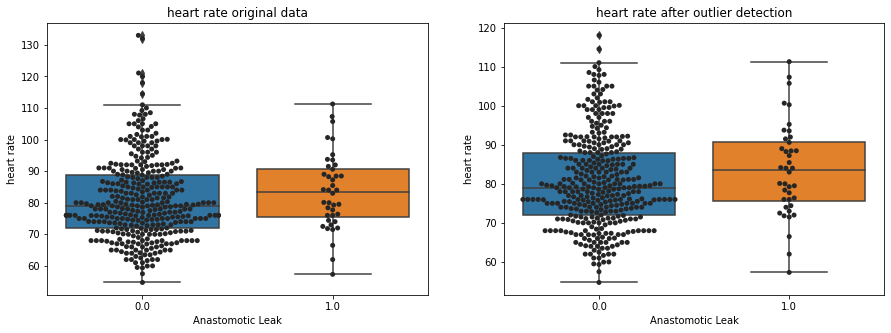

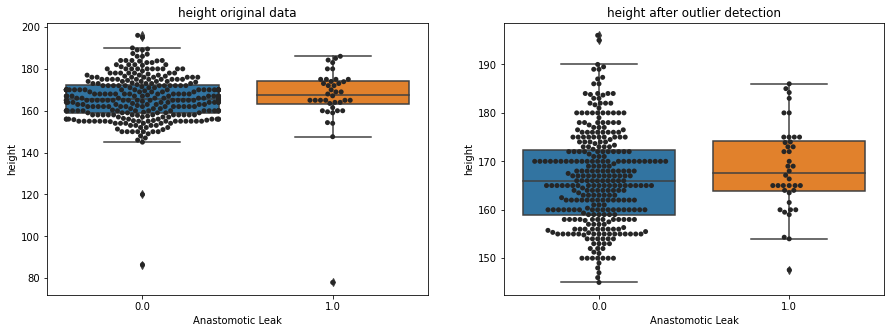

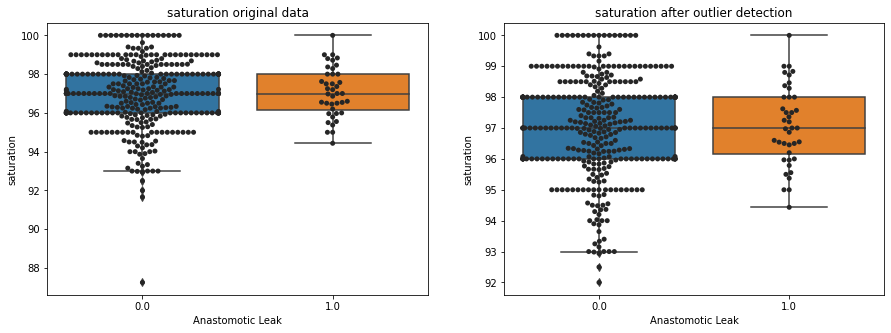

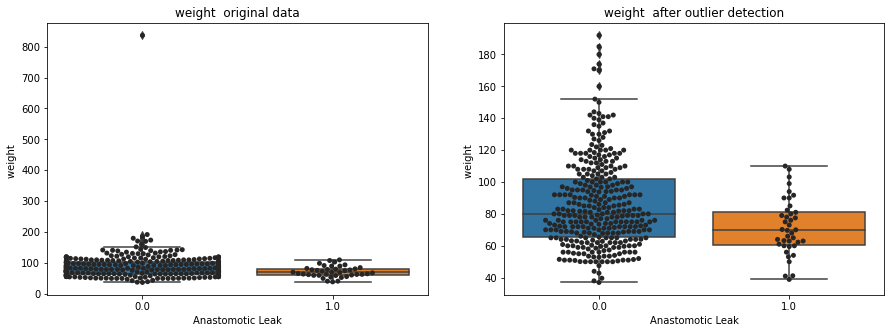

After Surgery


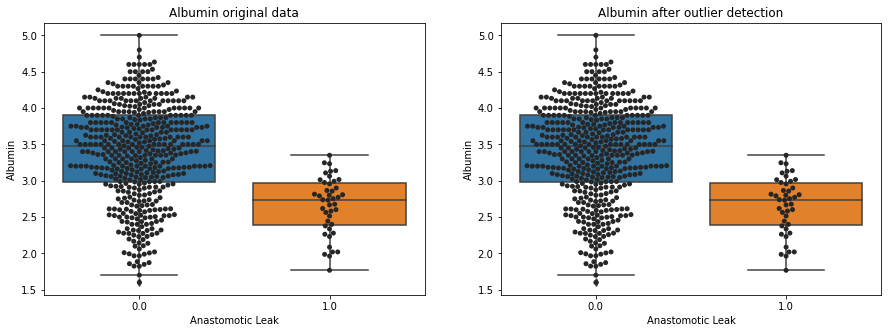

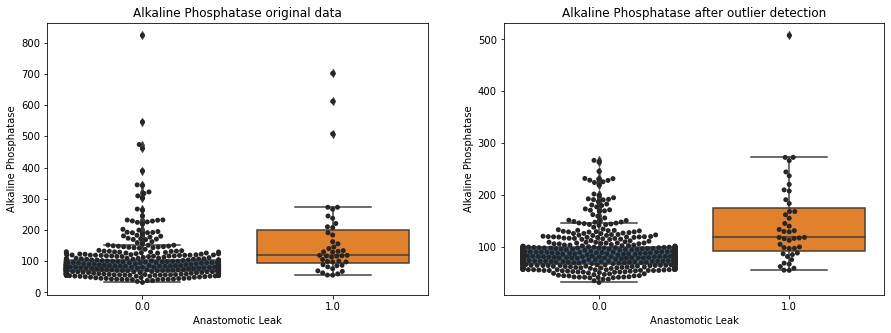

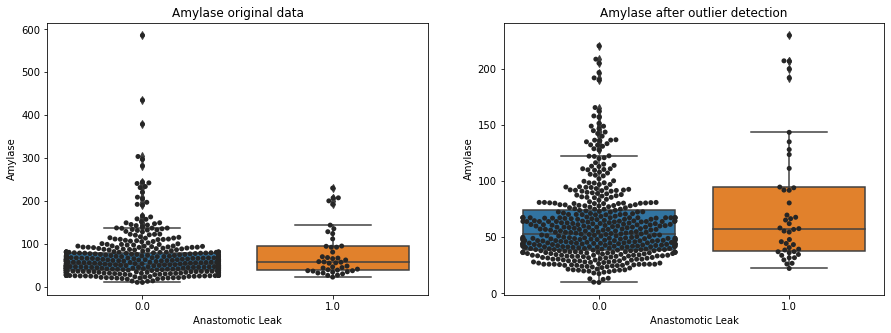

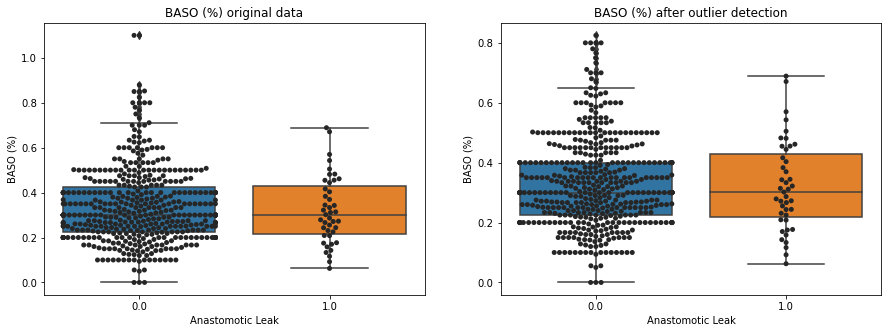

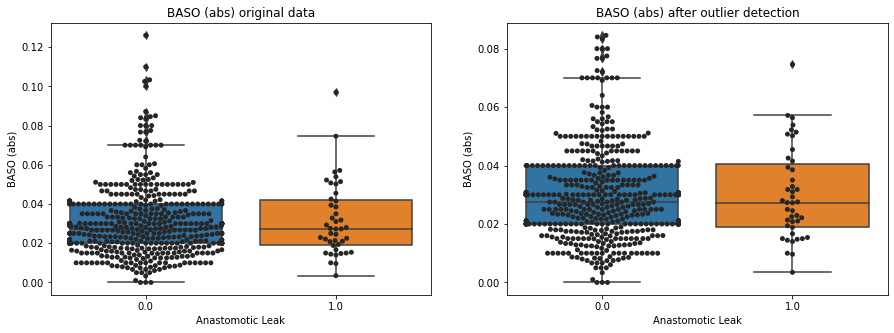

...

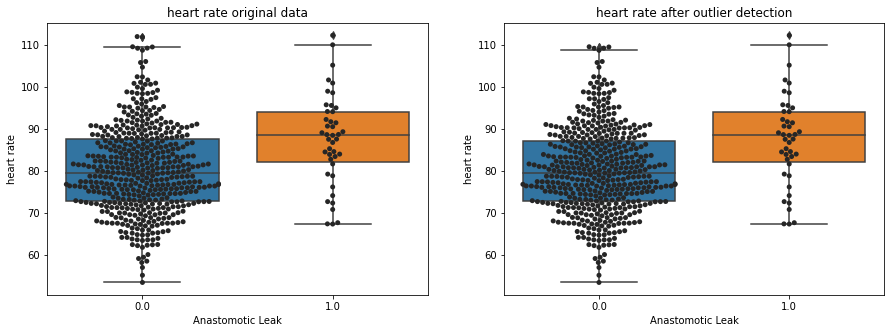

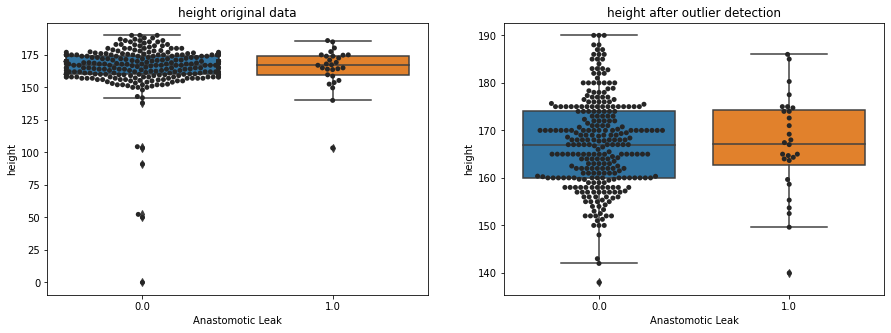

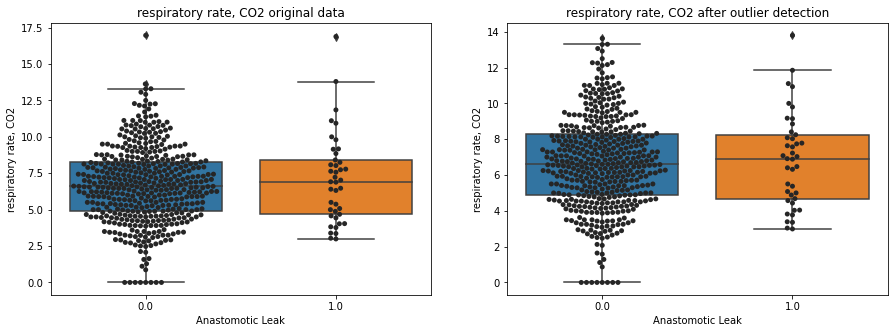

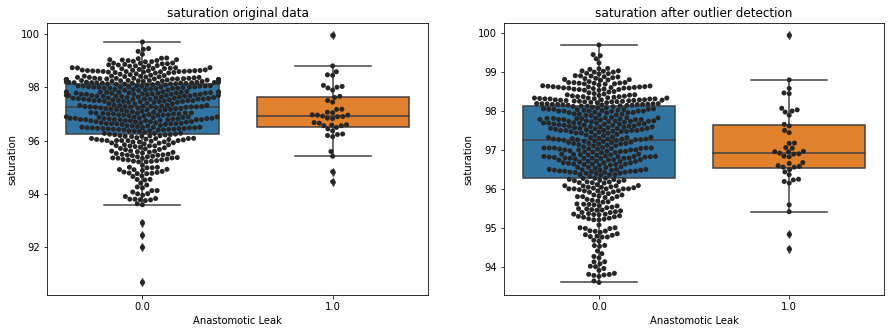

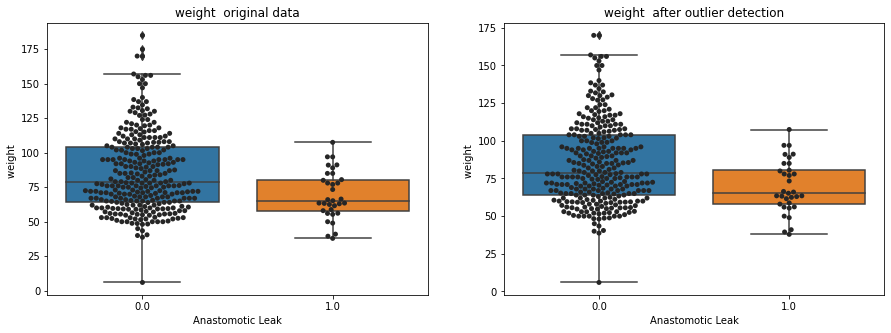

In [14]:
print('Before Surgery')
for i in stats_before_surgery_data.columns[1:]:
    outlier_detection_viz(before_surgery_data_no_od[['Anastomotic Leak', i]],i,before_surgery_data[['Anastomotic Leak', i]],i)
    
print('After Surgery')
for i in stats_after_surgery_data.columns[1:]:
    outlier_detection_viz(after_surgery_data_no_od[['Anastomotic Leak', i]],i,after_surgery_data[['Anastomotic Leak', i]],i)


##### 1.1.1 The Wilcoxon Rank Sum and Coefficient of Variation

In [15]:
# 2x2 matrix  class1 class 2
#   feature1     []  []
#   feature2     []  []

def catagorical_count_matrix (feature):
    mat = []
    for i in range(raw_data[feature].value_counts().size):
        try: a = raw_data[raw_data['Anastomotic Leak'] == 1][feature].value_counts()[i]
        except: a = 0
        try: b = raw_data[raw_data['Anastomotic Leak'] == 0][feature].value_counts()[i]
        except: b = 0
        a = [a,b]
        mat.append(a)
    return list(mat)

def calc_wrs(f):
    ## defining the two independent samples
    a = f[raw_data['Anastomotic Leak'] == 0.0].dropna()
    b = f[raw_data['Anastomotic Leak'] == 1.0].dropna()
    return stats.ranksums(a,b)

In [16]:
def get_pval_cv (original_df, stats_df):
# Allocating patient data p_val
    for i in zip(original_df.columns, original_df.dtypes):
        if i[1] == 'object':
            # Calcuating P_Val - catagorically with fisher's exact test
            stats_df[i[0]][0] = stats.fisher_exact(catagorical_count_matrix(i[0]))[1]
        else:
            # Calcuating P_Val - catagorically with WRS
            stats_df[i[0]][0] = calc_wrs(original_df[i[0]])[1]
            # Getting the CV - Coefficient of Variation
            stats_df[i[0]][1] = np.std(original_df[i[0]])/np.mean(original_df[i[0]])
    return

In [17]:
def plot_1row (df ,title, figsize, types, line, line_value):
    plt.figure(figsize=figsize)
    if (types == 'neg log'):
        # Log based e (NL)
        ax = sns.barplot(-np.log(df.values.reshape(-1,).tolist()), df.columns)
    else:
        ax = sns.barplot((df.values.reshape(-1,).tolist()), df.columns)
    if (line == True):
        plt.axvline(line_value, linestyle = '--', color='black')
        plt.axvline(-line_value, linestyle = '--', color='black')
    ax.set_title(title, size=20)
    for p in ax.patches:
        width = p.get_width() # bar length
        ax.text(width * 0.5, p.get_y() + p.get_height() / 2, '{:1.2f}'.format(width),  
                ha = 'center', va = 'center', size=13)
    return plt

In [18]:
get_pval_cv(patient_data,stats_patient_data)
get_pval_cv(before_surgery_data,stats_before_surgery_data)
get_pval_cv(after_surgery_data,stats_after_surgery_data)
get_pval_cv(delta, stats_surgery_data_delta)

##### Plotting P_Vals

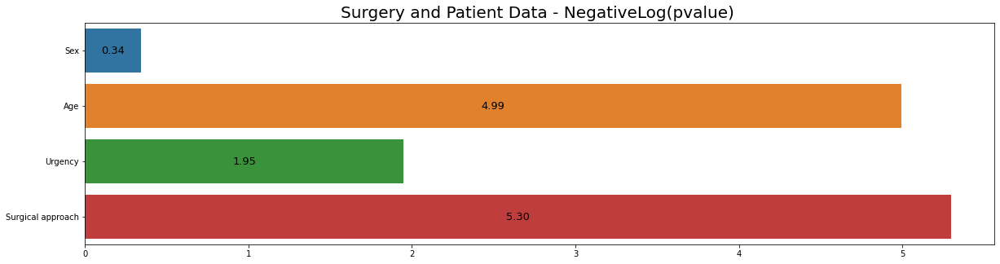

In [19]:
plot_1row(stats_patient_data.iloc[:1,:-1],"Surgery and Patient Data - NegativeLog(pvalue) ",(20,5),'neg log', False, _)
plt.show()


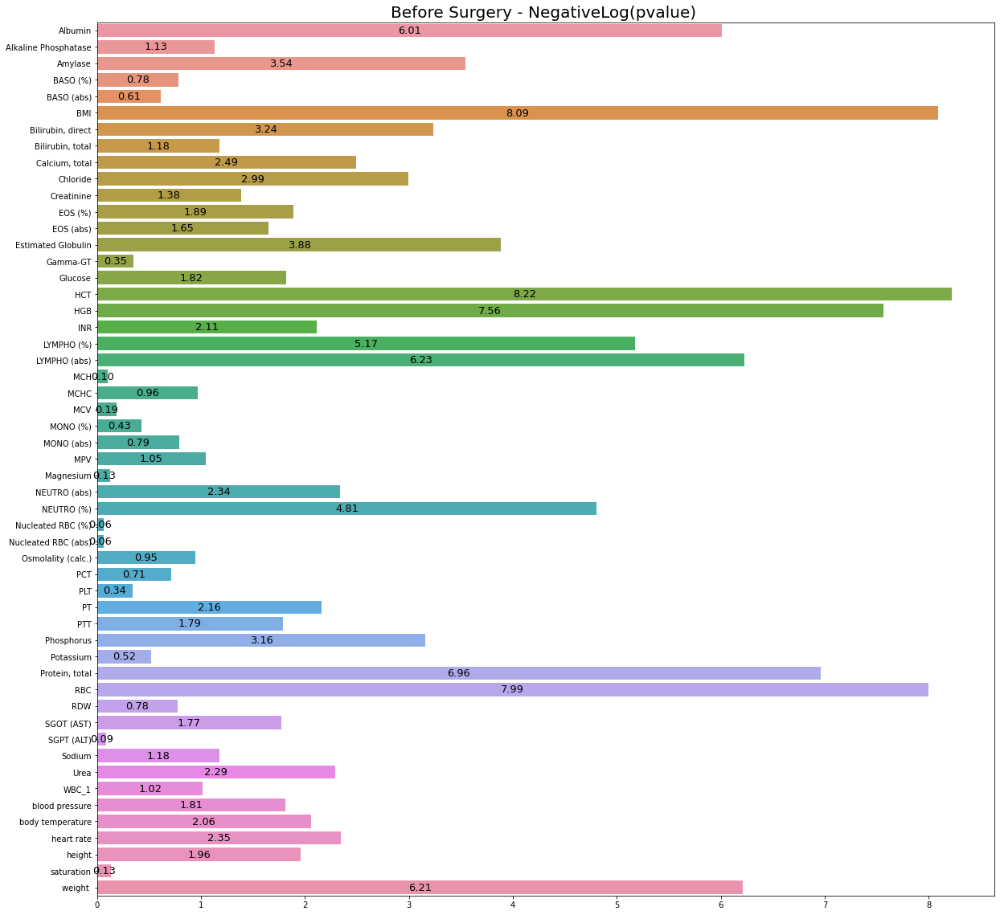

In [20]:
plot_1row(stats_before_surgery_data.iloc[:-1,1:],"Before Surgery - NegativeLog(pvalue) ",(20,20), 'neg log', False,_)
plt.show()


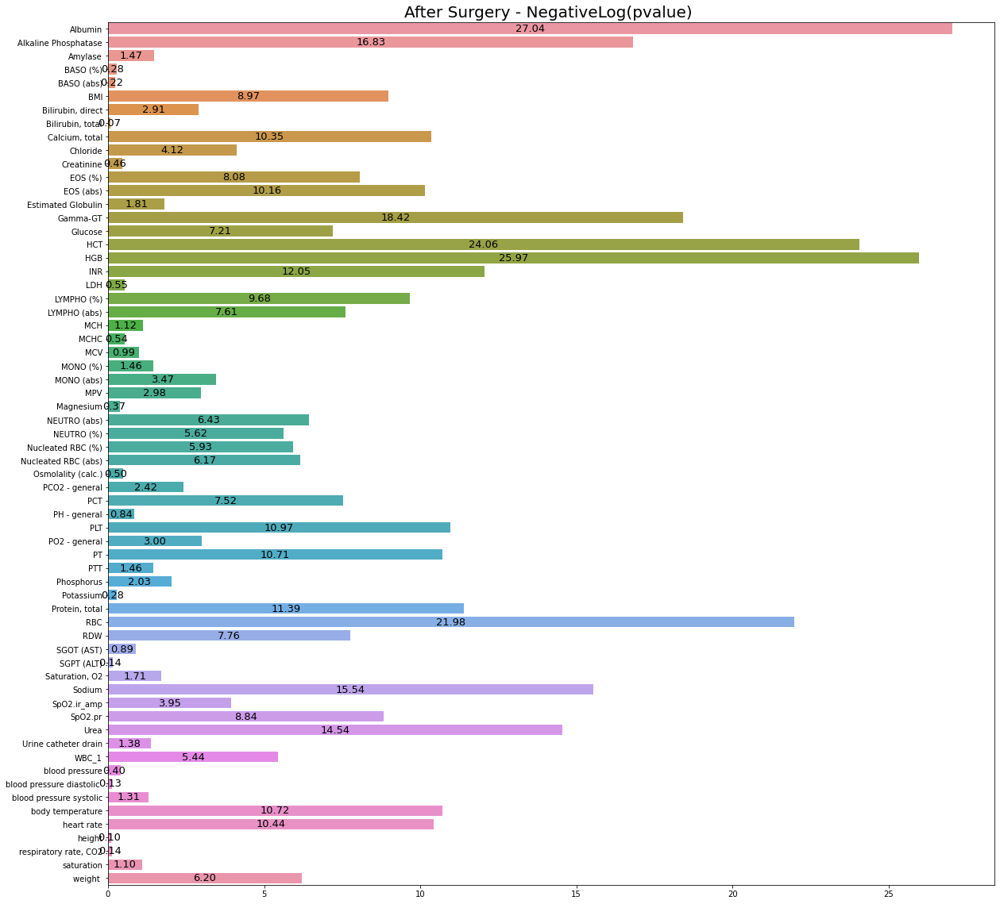

In [21]:
plot_1row(stats_after_surgery_data.iloc[:-1,1:],"After Surgery - NegativeLog(pvalue) ", (20,20),'neg log',False, _)
plt.show()


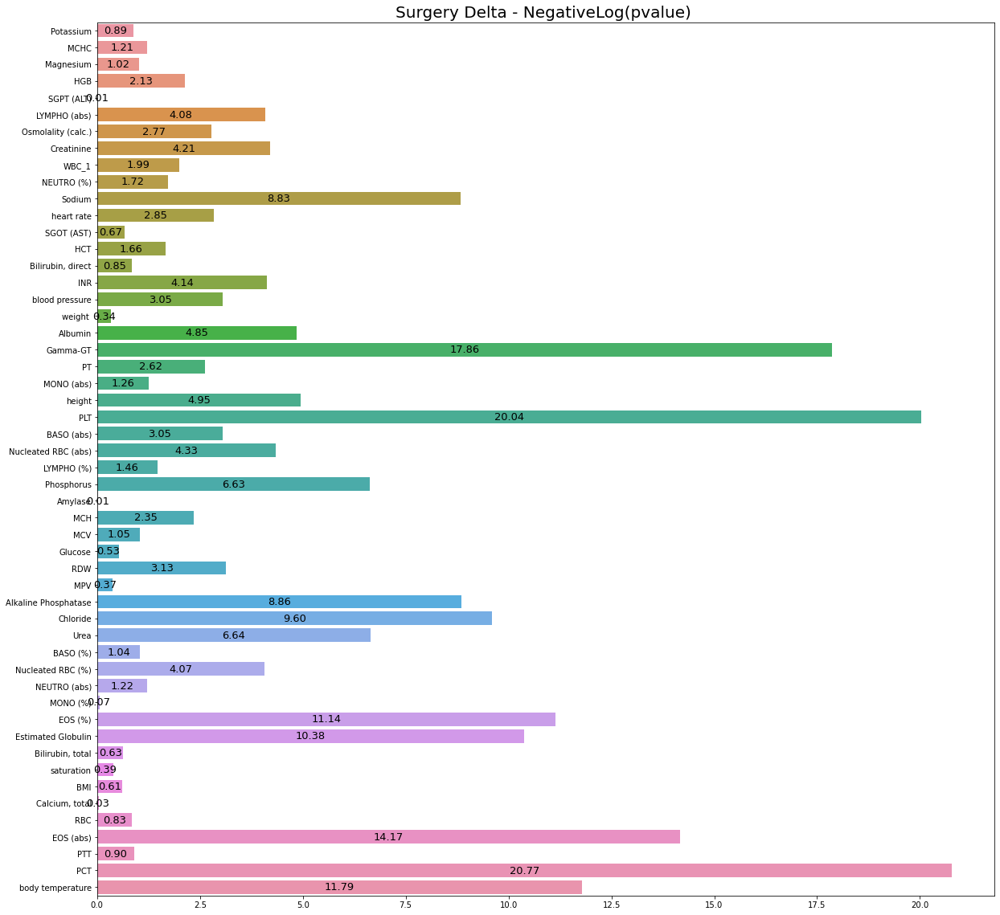

In [22]:
plot_1row(stats_surgery_data_delta.iloc[:-1,1:],"Surgery Delta - NegativeLog(pvalue) ", (20,20),'neg log', False, _)
plt.show()


##### 1.1.2. Disjointification
Ranking the features by the wrs, then take the highest, then take the correlation between the k-th and k-1 and then remove the bottom one if a correlation appears

In [23]:
def get_disjointification_value(df, stats_df):
    # If AL is an included feature, remove it
    if "Anastomotic Leak" in df.columns:
        sorted_df = stats_df.sort_values(by ='p_val', axis=1).drop("Anastomotic Leak",axis = 1)
    else:
        sorted_df = stats_df.sort_values(by ='p_val', axis=1)
    graph = pd.DataFrame(index = ["corr"])
    # Go over all sorted features 
    n = sorted_df.shape[1]
    i = 0
    while (i < n):
        features = [] # Features list will compare the top i features
        # Get the list of higher p-value'd features than the ith features
        for j in range(i,-1,-1):
            features.append(sorted_df.iloc[:,j].name)
#         print(f'current features: {features}')
        features_to_remove = []
        # compare their pearsons
        for comp_feature in features[1:]: # Dont compare the ith feature to itself
            temp = pd.DataFrame((df[features[0]], df[comp_feature])).T
            temp.dropna(axis=0, how = 'any',inplace=True)   
            pearson = stats.pearsonr(temp.iloc[:,0], temp.iloc[:,1])[0]
            graph["{} | {}".format(features[0],comp_feature)] = pearson
            if np.absolute(pearson) > 0.5:
#                 print("{} | {} - REMOVE".format(features[0],comp_feature),pearson)
                features_to_remove.append(features[0])
                n = n - 1
                i = i - 1
#             else:
#                 print("{} | {} - KEEP".format(features[0],comp_feature),pearson)
        i = i + 1
        sorted_df = sorted_df.drop(features_to_remove, axis=1)
    return graph, sorted_df

Index(['HCT', 'BMI', 'LYMPHO (%)', 'Estimated Globulin', 'Amylase',
       'Bilirubin, direct', 'Phosphorus', 'Chloride', 'heart rate', 'Urea',
       'PT', 'body temperature', 'height', 'EOS (%)', 'Glucose',
       'blood pressure', 'PTT', 'SGOT (AST)', 'Alkaline Phosphatase', 'MPV',
       'WBC_1', 'MCHC', 'Osmolality (calc.)', 'BASO (%)', 'RDW', 'PCT',
       'Potassium', 'MONO (%)', 'MCV', 'saturation', 'Magnesium',
       'Nucleated RBC (%)', 'Nucleated RBC (abs)'],
      dtype='object')


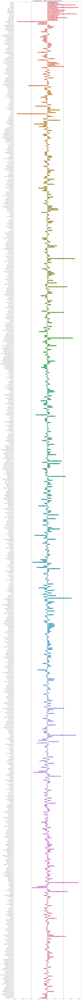

In [24]:
dj_before_surgery, before_surgery_final_features_corr = get_disjointification_value(before_surgery_data, stats_before_surgery_data)
print(before_surgery_final_features_corr.columns)
plot_1row(dj_before_surgery,"Disjointification - Before Surgery {}/{} Features ".format(len(before_surgery_final_features_corr.columns),len(before_surgery_data.columns)),(20,300),'regular', True, 0.5)
plt.show()

Index(['Albumin', 'Gamma-GT', 'Sodium', 'Urea', 'INR', 'PLT',
       'body temperature', 'heart rate', 'EOS (abs)', 'LYMPHO (%)', 'BMI',
       'Glucose', 'NEUTRO (abs)', 'Nucleated RBC (abs)', 'SpO2.ir_amp',
       'PO2 - general', 'MPV', 'Bilirubin, direct', 'Phosphorus',
       'Estimated Globulin', 'Saturation, O2', 'Amylase', 'MONO (%)', 'PTT',
       'Urine catheter drain', 'blood pressure systolic', 'MCH', 'saturation',
       'SGOT (AST)', 'PH - general', 'LDH', 'Magnesium', 'BASO (%)',
       'Potassium', 'respiratory rate, CO2', 'height', 'Bilirubin, total'],
      dtype='object')


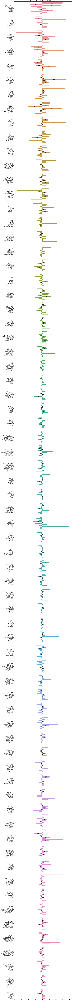

In [25]:
dj_after_surgery, after_surgery_final_features_corr = get_disjointification_value(after_surgery_data, stats_after_surgery_data)
print(after_surgery_final_features_corr.columns)
plot_1row(dj_after_surgery,"Disjointification - After Surgery {}/{} Features ".format(len(after_surgery_final_features_corr.columns),len(after_surgery_data.columns)),(20,350),'regular', True, 0.5)
plt.show()

Index(['PCT', 'Gamma-GT', 'EOS (abs)', 'body temperature',
       'Estimated Globulin', 'Chloride', 'Sodium', 'Urea', 'Phosphorus',
       'height', 'Albumin', 'Nucleated RBC (abs)', 'Creatinine', 'INR',
       'LYMPHO (abs)', 'RDW', 'blood pressure', 'BASO (abs)', 'heart rate',
       'MCH', 'WBC_1', 'MONO (abs)', 'Magnesium', 'PTT', 'Potassium',
       'Bilirubin, direct', 'SGOT (AST)', 'BMI', 'Glucose', 'saturation',
       'MPV', 'weight ', 'MONO (%)', 'Amylase', 'SGPT (ALT)'],
      dtype='object')


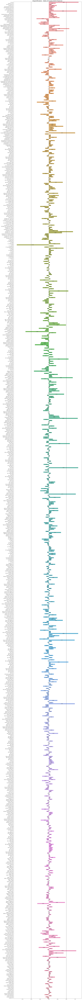

In [26]:
dj_delta_surgery, delta_surgery_final_features_corr = get_disjointification_value(delta, stats_surgery_data_delta)
print(delta_surgery_final_features_corr.columns)
plot_1row(dj_delta_surgery,"Disjointification - Delta of Surgery{}/{} Features ".format(len(delta_surgery_final_features_corr.columns),len(delta.columns)),(20,300),'regular', True, 0.5)
plt.show()

Overall, the remaining features for each dataset is

In [27]:
print("Feature list for before surgery after disjoing:")
print(list(before_surgery_final_features_corr.columns), '\n')
print("Feature list for after surgery after disjoing:")
print(list(after_surgery_final_features_corr.columns), '\n')
print("Feature list for delta between before and after surgery after disjoing:")
print(list(delta_surgery_final_features_corr.columns), '\n')

Feature list for before surgery after disjoing:
['HCT', 'BMI', 'LYMPHO (%)', 'Estimated Globulin', 'Amylase', 'Bilirubin, direct', 'Phosphorus', 'Chloride', 'heart rate', 'Urea', 'PT', 'body temperature', 'height', 'EOS (%)', 'Glucose', 'blood pressure', 'PTT', 'SGOT (AST)', 'Alkaline Phosphatase', 'MPV', 'WBC_1', 'MCHC', 'Osmolality (calc.)', 'BASO (%)', 'RDW', 'PCT', 'Potassium', 'MONO (%)', 'MCV', 'saturation', 'Magnesium', 'Nucleated RBC (%)', 'Nucleated RBC (abs)'] 

Feature list for after surgery after disjoing:
['Albumin', 'Gamma-GT', 'Sodium', 'Urea', 'INR', 'PLT', 'body temperature', 'heart rate', 'EOS (abs)', 'LYMPHO (%)', 'BMI', 'Glucose', 'NEUTRO (abs)', 'Nucleated RBC (abs)', 'SpO2.ir_amp', 'PO2 - general', 'MPV', 'Bilirubin, direct', 'Phosphorus', 'Estimated Globulin', 'Saturation, O2', 'Amylase', 'MONO (%)', 'PTT', 'Urine catheter drain', 'blood pressure systolic', 'MCH', 'saturation', 'SGOT (AST)', 'PH - general', 'LDH', 'Magnesium', 'BASO (%)', 'Potassium', 'respirator

| Abbreviation | Definition |
| --- | --- |
| PT | Prothrombin time - a blood test that measures how long it takes blood to clot|
| EOS % | Eosinophil count - a blood test that measures the number of one type of white blood cells called eosinophils |
| PTT | Partial Thromboplastin Time - time it took for your blood to clot |
| BASO (abs) | Basophils are white blood cells from the bone marrow that play a role in keeping the immune system functioning correctly |
| MPV | Mean platelet volume - Platelets are small blood cells that are essential for blood clotting, the process that helps you stop bleeding after an injury |
| MONO | Mono test - indicates a likely diagnosis of infectious mononucleosis |
| PLT | Platelets |
| SGPT (ALT) | Alanine Aminotransferase - Will indicate liver damage if levels are high |
| MCH | Mean corpuscular hemoglobin - refers to the average quantity of hemoglobin present in a single red blood cell |
| --- | -------- |
| SpO2.pr | Oxygen saturation levels |
| PCT | Procalcitonin - indicats suspicion of bacterial sepsis |
| PCO2 - general | Partial pressure of carbon dioxide |
| --- | -------- |
| PLT | Platelets |
| MCHC | The average amount of hemoglobin inside of a single red blood cell, and it's often ordered as part of a CBC panel. |
| RDW | Red Cell Distribution Width - commonly used to diagnose anemia, a condition in which your red blood cells can't carry enough oxygen to the rest of your body |
| LYMPHO (%) | A blood test that counts how many lymphocytes are in a person's blood is called a B and T cell screen |
| MCV | Mean corpuscular volume - measures the average size of your red blood cells, also known as erythrocytes |


#### FDR
Apply false discovery rate

https://matthew-brett.github.io/teaching/fdr.html

In [28]:
def get_fdr_plot (df1, title1, df2, title2):
    fig, (ax1, ax2) = plt.subplots(1, 2,figsize=(15,5))

    p_values = np.sort(df1)
    q = 0.05
    N = p_values.size
    i = np.arange(1,N+1) # the 1-based i index of the p values, as in p(i)
    
    ax1.set_title(title1)
    ax1.plot(i, p_values,  'b.', label='$p(i)$')
    ax1.plot(i, q * i / N, 'r', label='$q i / N$') # the acceptable number of false positives
    ax1.set_xlabel('$i$')
    ax1.set_ylabel('p value')
    idx1 = np.argwhere(np.diff(np.sign(p_values - (q * i / N)))).flatten()

    p_values = np.sort(df2)
    N = p_values.size
    i = np.arange(1,N+1) # the 1-based i index of the p values, as in p(i)

    ax2.set_title(title2)
    ax2.plot(i, p_values,  'b.', label='$p(i)$')
    ax2.plot(i, q * i / N, 'r', label='$q i / N$') # the acceptable number of false positives
    ax2.set_xlabel('$i$')
    ax2.set_ylabel('p value')
    idx2 = np.argwhere(np.diff(np.sign(p_values - (q * i / N)))).flatten()

    return idx1[0]+1, idx2[0]+1, plt

We are looking for the largest $p(i) < q*i/N$, which corresponds to the last blue point below the red line

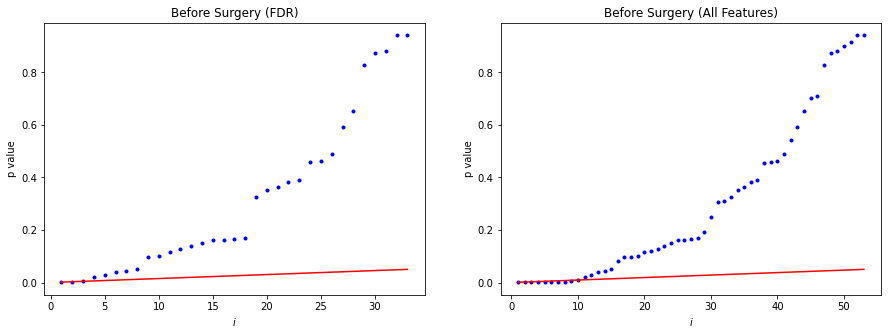

List of meaningful 2 features after FDR 
['HCT', 'BMI']

List of meaningful 10 features 
['Albumin', 'Alkaline Phosphatase', 'Amylase', 'BASO (%)', 'BASO (abs)', 'BMI', 'Bilirubin, direct', 'Bilirubin, total', 'Calcium, total', 'Chloride']


In [29]:
i, j, p = get_fdr_plot(stats_before_surgery_data[before_surgery_final_features_corr.columns].iloc[0,:], 
             'Before Surgery (FDR)',
             stats_before_surgery_data.iloc[0,1:], 
             'Before Surgery (All Features)')
p.show()
print(f'List of meaningful {i} features after FDR \n{list(stats_before_surgery_data[before_surgery_final_features_corr.columns].columns[:i])}')
print(f'\nList of meaningful {j} features \n{list(stats_before_surgery_data.columns[1:j+1])}')


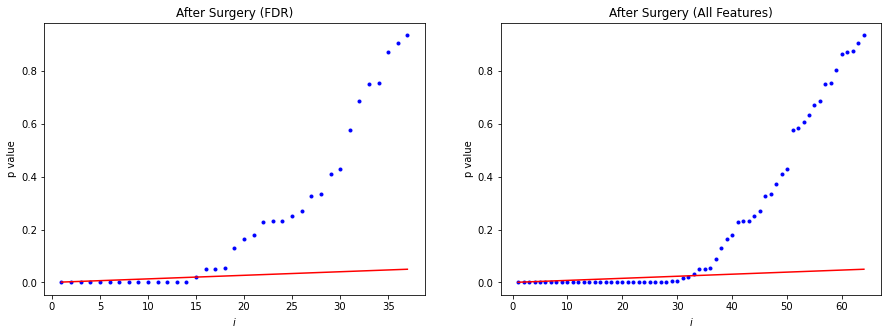

List of meaningful 15 features after FDR 
['Albumin', 'Gamma-GT', 'Sodium', 'Urea', 'INR', 'PLT', 'body temperature', 'heart rate', 'EOS (abs)', 'LYMPHO (%)', 'BMI', 'Glucose', 'NEUTRO (abs)', 'Nucleated RBC (abs)', 'SpO2.ir_amp']

List of meaningful 32 features 
['Albumin', 'Alkaline Phosphatase', 'Amylase', 'BASO (%)', 'BASO (abs)', 'BMI', 'Bilirubin, direct', 'Bilirubin, total', 'Calcium, total', 'Chloride', 'Creatinine', 'EOS (%)', 'EOS (abs)', 'Estimated Globulin', 'Gamma-GT', 'Glucose', 'HCT', 'HGB', 'INR', 'LDH', 'LYMPHO (%)', 'LYMPHO (abs)', 'MCH', 'MCHC', 'MCV', 'MONO (%)', 'MONO (abs)', 'MPV', 'Magnesium', 'NEUTRO (abs)', 'NEUTRO\xa0(%)', 'Nucleated RBC (%)']


In [30]:
i, j, p = get_fdr_plot(stats_after_surgery_data[after_surgery_final_features_corr.columns].iloc[0,:], 
             'After Surgery (FDR)',
             stats_after_surgery_data.iloc[0,1:], 
             'After Surgery (All Features)')
p.show()
print(f'List of meaningful {i} features after FDR \n{list(stats_after_surgery_data[after_surgery_final_features_corr.columns].columns[:i])}')
print(f'\nList of meaningful {j} features \n{list(stats_after_surgery_data.columns[1:j+1])}')


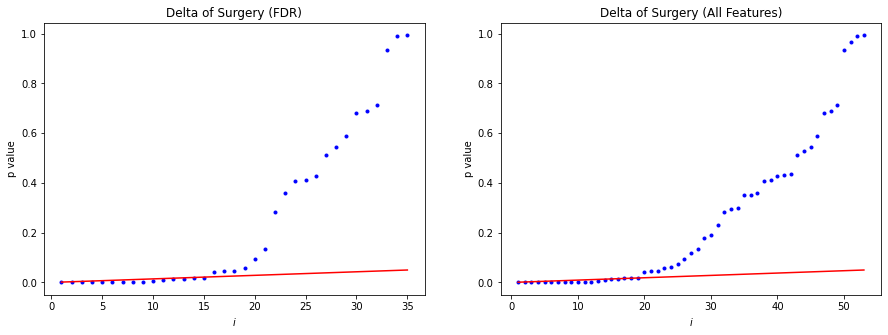

List of meaningful 15 features after FDR 
['PCT', 'Gamma-GT', 'EOS (abs)', 'body temperature', 'Estimated Globulin', 'Chloride', 'Sodium', 'Urea', 'Phosphorus', 'height', 'Albumin', 'Nucleated RBC (abs)', 'Creatinine', 'INR', 'LYMPHO (abs)']

List of meaningful 19 features 
['Protein, total', 'Potassium', 'MCHC', 'Magnesium', 'HGB', 'SGPT (ALT)', 'LYMPHO (abs)', 'Osmolality (calc.)', 'Creatinine', 'WBC_1', 'NEUTRO\xa0(%)', 'Sodium', 'heart rate', 'SGOT (AST)', 'HCT', 'Bilirubin, direct', 'INR', 'blood pressure', 'weight ']


In [31]:
i, j, p = get_fdr_plot(stats_surgery_data_delta[delta_surgery_final_features_corr.columns].iloc[0,:], 
             'Delta of Surgery (FDR)',
             stats_surgery_data_delta.iloc[0,:], 
             'Delta of Surgery (All Features)')

p.show()
print(f'List of meaningful {i} features after FDR \n{list(stats_surgery_data_delta[delta_surgery_final_features_corr.columns].columns[:i])}')
print(f'\nList of meaningful {j} features \n{list(stats_surgery_data_delta.iloc[:,:j].columns)}')


##### FDR Fix


In [32]:
stats_before_surgery_data[before_surgery_final_features_corr.columns]

,HCT,BMI,LYMPHO (%),Estimated Globulin,Amylase,"Bilirubin, direct",Phosphorus,Chloride,heart rate,Urea,...,BASO (%),RDW,PCT,Potassium,MONO (%),MCV,saturation,Magnesium,Nucleated RBC (%),Nucleated RBC (abs)
p_val,0.000269402,0.000306221,0.00565652,0.0205568,0.029024,0.0393519,0.0424606,0.0502014,0.0956442,0.101235,...,0.458657,0.460619,0.489593,0.593778,0.651451,0.828535,0.874865,0.87989,0.940733,0.940733
cv,0.150036,0.30298,0.435346,0.139085,0.517857,0.733241,0.165163,0.026972,0.146597,0.42611,...,0.491809,0.13175,0.290665,0.0846139,0.283844,0.0714861,0.0164464,0.0929126,6.89231,6.98593


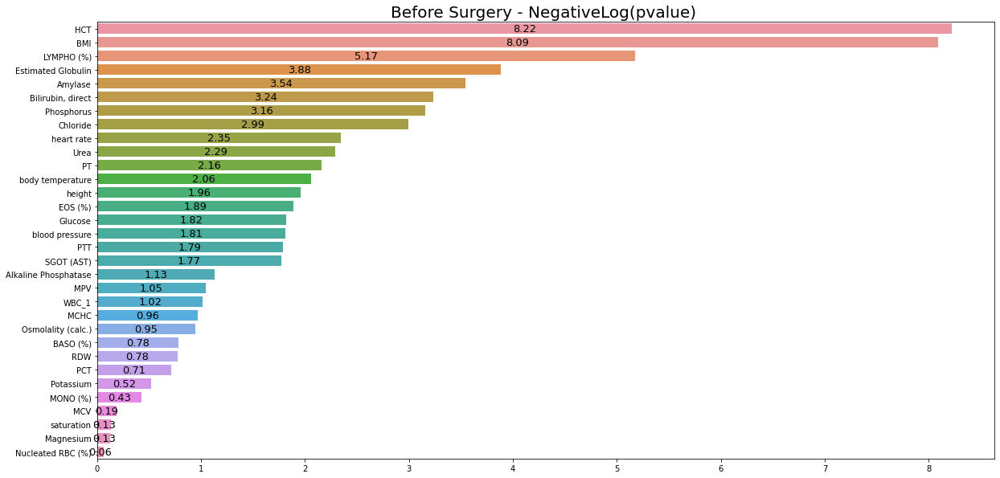

In [33]:
plot_1row(stats_before_surgery_data[before_surgery_final_features_corr.columns].iloc[:1,:-1],"Before Surgery - NegativeLog(pvalue) ",(20,10),'neg log', False, _)
plt.show()

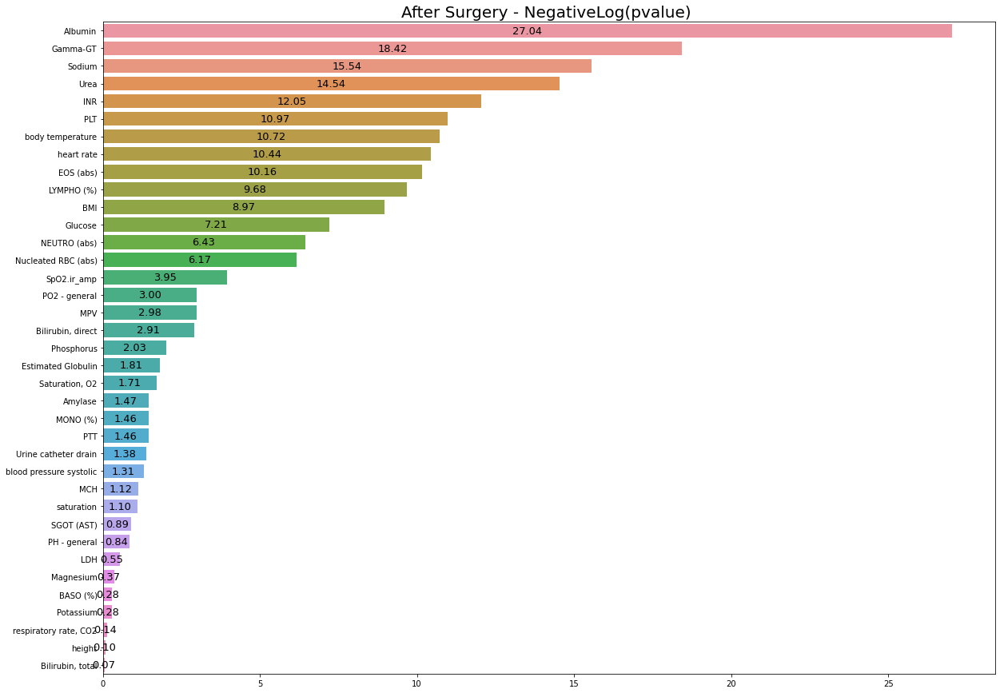

In [34]:
plot_1row(stats_after_surgery_data[after_surgery_final_features_corr.columns].iloc[:1,:],"After Surgery - NegativeLog(pvalue) ",(20,15),'neg log', False, _)
plt.show()

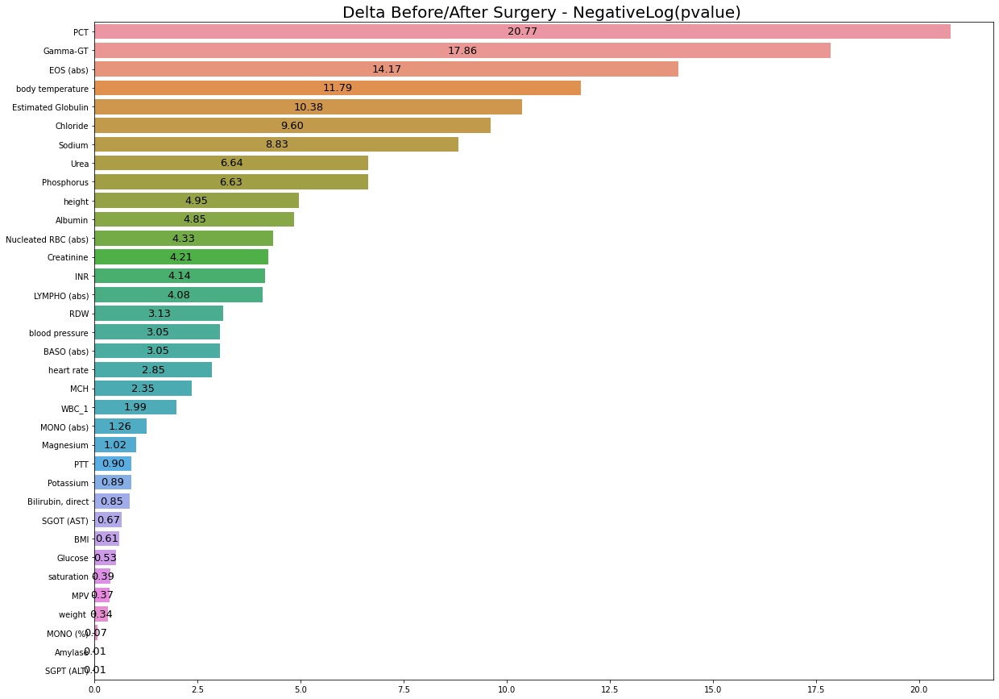

In [35]:
plot_1row(stats_surgery_data_delta[delta_surgery_final_features_corr.columns].iloc[:1,:],"Delta Before/After Surgery - NegativeLog(pvalue) ",(20,15),'neg log', False, _)
plt.show()


## Export all data to excel files

In [37]:
before_surgery_data.head(-40)

,Anastomotic Leak,Albumin,Alkaline Phosphatase,Amylase,BASO (%),BASO (abs),BMI,"Bilirubin, direct","Bilirubin, total","Calcium, total",...,SGPT (ALT),Sodium,Urea,WBC_1,blood pressure,body temperature,heart rate,height,saturation,weight
2,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0.0,3.900000,90.000000,53.000000,0.400000,0.040000,38.800000,0.060000,0.370000,9.800000,...,22.000000,138.000000,24.000000,10.770000,103.750000,36.550000,75.500000,163.0,99.000000,103.000000
4,0.0,4.300000,70.000000,NaN,0.300000,0.030000,NaN,NaN,0.360000,9.700000,...,13.000000,137.000000,28.000000,7.670000,100.500000,36.900000,89.000000,NaN,98.000000,NaN
5,0.0,3.843669,94.000000,32.692308,0.121429,0.015714,23.600000,0.180000,0.586429,7.428571,...,14.692308,134.213158,37.000000,12.750385,103.144578,36.591257,94.351145,150.0,96.309524,53.500000
6,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,134.600000,NaN,NaN,106.500000,36.600000,105.000000,NaN,95.000000,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
524,0.0,4.300000,92.000000,95.000000,0.500000,0.030000,26.600000,0.080000,0.420000,9.200000,...,21.000000,138.000000,40.000000,6.450000,93.500000,36.800000,67.000000,168.0,98.000000,75.000000
525,0.0,3.700000,101.000000,40.000000,0.400000,0.030000,24.400000,0.070000,0.480000,9.100000,...,7.000000,139.000000,38.000000,7.460000,97.250000,36.700000,79.500000,167.0,97.000000,68.000000
1,1.0,4.200000,97.000000,63.000000,0.500000,0.030000,35.300000,0.220000,1.500000,9.900000,...,22.000000,139.000000,33.000000,6.950000,92.250000,36.350000,71.500000,175.0,97.500000,108.000000
11,1.0,3.126250,64.500000,158.441860,0.377660,0.033298,NaN,0.286250,0.668875,8.567901,...,14.200000,139.678537,39.756098,11.655171,83.076923,36.195315,105.719902,186.0,95.555556,103.175000


In [40]:
# RAW DATA
before_surgery_data.to_excel(r'../generated_data/raw-data-before-surgery.xlsx', index = False)
# after_surgery_data.to_excel(r'../generated_data/raw-data-after-surgery.xlsx', index = False)
# delta.to_excel(r'../generated_data/raw-data-delta-surgery.xlsx', index = False)

# # ALL STATS
# stats_before_surgery_data.to_excel(r'../generated_data/stats-before-surgery.xlsx', index = False)
# stats_after_surgery_data.to_excel(r'../generated_data/stats-after-surgery.xlsx', index = False)
# stats_surgery_data_delta.to_excel(r'../generated_data/stats-delta-surgery.xlsx', index = False)

# # AFTER WRS STATS
before_surgery_data[before_surgery_final_features_corr.columns.append(pd.Index(['Anastomotic Leak']))].to_excel(r'../generated_data/wrs-before-surgery.xlsx', index = False)
# after_surgery_final_features_corr.to_excel(r'../generated_data/stats-wrs-after-surgery.xlsx', index = False)
# delta_surgery_final_features_corr.to_excel(r'../generated_data/stats-wrs-delta-surgery.xlsx', index = False)

# # FDR STATS
# stats_before_surgery_data[before_surgery_final_features_corr.columns].to_excel(r'../generated_data/stats-fdr-before-surgery.xlsx', index = False)
# stats_after_surgery_data[after_surgery_final_features_corr.columns].to_excel(r'../generated_data/stats-fdr-after-surgery.xlsx', index = False)
# stats_surgery_data_delta[delta_surgery_final_features_corr.columns].to_excel(r'../generated_data/stats-fdr-delta-surgery.xlsx', index = False)
